# Stochastic Data Generation & Visualisation
### This notebook is used to pre-process and visualise stochastic data generated from examples in Ping's thesis.

## System initialisation

In [1]:
# Import relevant libraries
import numpy as np # For tensor manipulation in Python
import plotly
import plotly.offline as pyo # For offline interactive plotting
import plotly.graph_objs as go # For generating JSON plot objects in Plotly
import math # For nonlinear mathematical functions

# Activate Plotly Offline for Jupyter
pyo.init_notebook_mode(connected=True)

# Set printing precision
np.set_printoptions(2)

## Example 1: Linear correlated continuous random variables

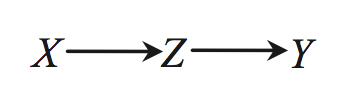

$ 
\begin{align} 
X_k &\sim \mathcal{N}(0, 1) \\
v_{1k}, v_{2k} &\sim \mathcal{N}(0, 0.1) \\
Z_{k+1} &= 0.8 X_k + 0.2 Z_k + v_{1k} \\
Y_{k+1} &= 0.6 Z_k + v_{2k} \\
\\
\text{Such that:} \\
Z_0 &= 3.2
\end{align} 
$

### Generate data

In [2]:
def generate_ex1(n):
    '''
    Generate data for Example 1.

    Input:
        n: Time-series length

    Returns:
        Dictionary of numpy time-series variables.
    '''
    # Define an empty dict
    ex = {}
    
    # Convert n to int
    n = int(n)

    # Generate source variables
    ex['X'] = np.random.normal(0, 1, size=(n,))
    ex['v1'] = np.random.normal(0, 0.1, size=(n,))
    ex['v2'] = np.random.normal(0, 0.1, size=(n,))

    # Initialise dependent variables
    ex['Z'] = np.zeros((n,))
    ex['Z'][0] = 3.2
    ex['Y'] = np.zeros((n,))

    # Generate dependent variables
    for k in range(n - 1):
        ex['Z'][k + 1] = 0.8 * ex['X'][k] + 0.2 * ex['Z'][k] + ex['v1'][k]
        ex['Y'][k + 1] = 0.6 * ex['Z'][k] + ex['v2'][k]
        
    return ex

ex1 = generate_ex1(6e3)

In [3]:
ex1

{'X': array([ 0.47,  0.  ,  0.72, ...,  0.57, -0.69,  0.05]),
 'Y': array([ 0.  ,  1.94,  0.57, ..., -0.66, -0.48,  0.01]),
 'Z': array([ 3.2 ,  0.97,  0.26, ..., -0.71,  0.41, -0.4 ]),
 'v1': array([-0.05,  0.07,  0.09, ...,  0.09,  0.07,  0.04]),
 'v2': array([ 0.02, -0.01,  0.06, ..., -0.05, -0.23, -0.08])}

In [4]:
def visualise_data(data, ex):
    '''
    Visualise data through an interactive graph.

    Input:
        data: Dictionary of numpy time-series variables in order of X, Y, Z, v1 and v2
        ex: Example being plotted (1, 2, 3) (string)

    Returns:
        Interactive offline Plotly chart
    '''
    # Define empty trace and variable name list
    traces = []

    # Define and append trace for each variable
    # Set visibility of noise variables to 'legendonly'
    for key in sorted(data):
        traces.append(
            go.Scatter(
                x = range(len(data[key])),
                y = data[key],
                name = key,
                visible = 'legendonly' if key == 'v1' or key == 'v2' else True
            )
        )

    # Convert traces to JSON-like object
    data = go.Data(traces)

    # Define JSON-like layout
    layout = go.Layout(
        title = 'Time-series Plots of Example ' + str(ex),
        xaxis = {'title': 'Sampling time'},
    )

    # Generate and plot figure
    figure = go.Figure(data=data, layout=layout)
    pyo.iplot(figure)

In [5]:
visualise_data(ex1, '1')

### Output data

In [8]:
def collapse_data(data, deg, ex, burn_in=0):
    '''
    Given degree d, collapse an N x M time-series data matrix into a (N - d + 1) x (d x M) data matrix. 
    Additional (d - 1) x M columns are for 'initial', ('intermediary') and 'final' values of all M variables.

    Inputs:
        data:    Matrix of M time-series each of length N (N x M)
        d:       Degree of Bayesian network
        ex:      Example being processed (1, 2, 3) (string)
        burn_in: Initial number of sampling intervals ignored to ensure stationarity of time-series

    Returns:
        Collapsed data matrix of size (N - d + 1) x (d x M)
        Headers of collapsed matrix
    '''
    # Define N and M
    N, M = data.shape
    
    # Define empty output matrix
    new_mat = np.zeros((N - deg + 1, deg * M))
    
    # Define header key
    head_key = ['r1_', 'r2_', 'y1_', 'y2_'] if str(ex) == '3' else ['X', 'Y', 'Z']
    
    # Define empty header list
    header = []
    
    # Create d duplicates of each time-series, and shift duplicated time-series by one sampling interval
    # Populate header list
    for col, var in enumerate(data.T):
        for i in range(deg):
            new_mat[:, col * deg + i] = var[i:(N - deg + i + 1)]
            header.append(head_key[col] + str(i))
    
    return new_mat[max(burn_in - 1, 0):], header

In [9]:
def output_csv(data, deg, ex, burn_in=0):
    '''
    Output data into CSV file.

    Input:
        data:    Dictionary of time-series variables
        deg:     Degree of Bayesian network
        ex:      Example being processed (1, 2, 3) (string)
        burn_in: Initial number of sampling intervals ignored to ensure stationarity of time-series
    '''
    assert str(ex) == '1' or str(ex) == '2' or str(ex) == '3'
    
    # Obtain length of data
    try:
        n = len(data['X'])
    except:
        n = len(data['r1'])
    
    if str(ex) == '1' or str(ex) == '2':
        # Combine X, Y, and Z into one output
        output = np.append(data['X'], np.append(data['Y'], data['Z'])).reshape(n, 3, order='F')
    elif str(ex) == '3':
        # Combine r1, r2, y1 and y2 into one output:
        output = np.append(data['r1'], np.append(data['r2'], np.append(data['y1'], data['y2'])))\
                    .reshape(n, 4, order='F')
    
    # Collapse data matrix based on degree of Bayesian network
    collapsed, header = collapse_data(output, deg, ex, burn_in)
    
    # Output CSV file
    np.savetxt('./ex{}_deg{}.csv'.format(ex, deg), collapsed, delimiter=',', header=','.join(header));

In [10]:
ex1['Z'][:10]

array([ 3.2 ,  0.97,  0.26,  0.72,  0.95,  0.84, -1.1 ,  0.47, -1.73, -0.7 ])

In [13]:
output_csv(data=ex1, deg=2, ex=1)

## Example 2: Nonlinear correlated continuous random variables

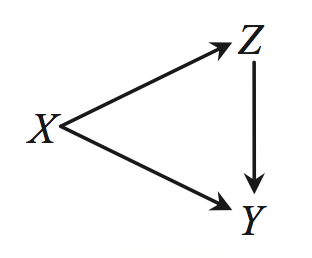

$
\begin{align}
X_k &\in [4, 5] \sim U(4, 5) \\
v_{1k}, v_{2k} &\sim \mathcal{N}(0, 0.0.5) \\
Z_{k+1} &= 1 - 2 \ \left| \ 0.5 - \left( 0.8 X_k + 0.4 \sqrt{\left| \ Z_k \ \right|} \right) \ \right| + v_{1k} \\
Y_{k+1} &= 5 \left( Z_k + 7.2 \right)^2 + 10 \sqrt{\left|X_k \right|} + v_{2k} \\
\\
\text{Such that:} \\
Z_0 &= 0.2
\end{align}
$

### Generate data

In [13]:
def generate_ex2(n):
    '''
    Generate data for Example 2.

    Input:
        n: Time-series length

    Returns:
        Dictionary of numpy time-series variables.
    '''
    # Define an empty dict
    ex = {}
    
    # Convert n to int
    n = int(n)

    # Generate source variables
    ex['X'] = np.random.uniform(4, 5, size=(n,))
    ex['v1'] = np.random.normal(0, 0.05, size=(n,))
    ex['v2'] = np.random.normal(0, 0.05, size=(n,))

    # Initialise dependent variables
    ex['Z'] = np.zeros((n,))
    ex['Z'][0] = 0.2
    ex['Y'] = np.zeros((n,))

    # Generate dependent variables
    for k in range(n - 1):
        ex['Z'][k + 1] = 1 - 2 * abs(0.5 - (0.8 * ex['X'][k] + 0.4 * math.sqrt(abs(ex['Z'][k])))) + ex['v1'][k]
        ex['Y'][k + 1] = 5 * (ex['Z'][k] + 7.2)**2 + 10 * math.sqrt(abs(ex['X'][k])) + ex['v2'][k]
        
    return ex

ex2 = generate_ex2(6e3)

In [14]:
ex2

{'X': array([ 4.68,  4.66,  4.83, ...,  4.91,  5.  ,  4.76]),
 'Y': array([   0.  ,  295.51,   29.95, ...,   21.69,   23.27,   26.2 ]),
 'Z': array([ 0.2 , -5.91, -7.45, ..., -7.67, -8.08, -8.26]),
 'v1': array([-0.06, -0.05, -0.  , ..., -0.02,  0.01, -0.  ]),
 'v2': array([ 0.07, -0.  , -0.03, ...,  0.02, -0.06, -0.05])}

### Visualise data

In [15]:
visualise_data(ex2, '2')

### Output CSV file from data

In [13]:
output_csv(data=ex2, deg=3, ex='2', burn_in=3000)

## Example 3: 2x2 MIMO System with Sensor Noise
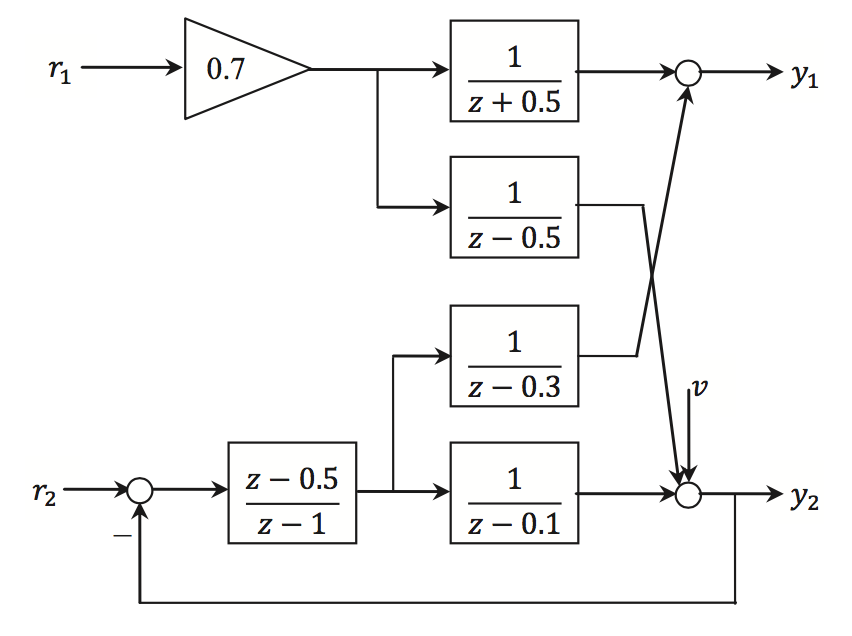

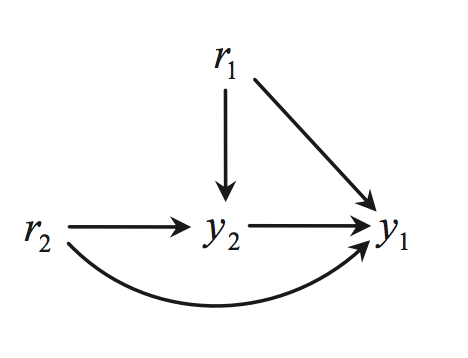

#### Net transfer functions:

$
\begin{align}
y_1(s) &= \frac{0.7}{z + 0.5}r_1(s) + \frac{z - 0.5}{z^2 - 1.3 z + 0.3}r_2(s) - \frac{z - 0.5}{z^2 - 1.3z + 0.3} y_2(s) \\
&= \frac{0.7 z^3 - 0.98 z^2 - 0.539 z + 0.119}{z^4 + 0.1 z^3 - 0.57 z^2 - 0.065z + 0.06} r_1(s) + \frac{z^5 - 1.2z^4 - 0.94 z^3 + 2.48z^2 - 1.3375z + 0.11}{z^6 - 2 z^5 +0.92 z^4 + 0.402 z^3 - 0.4125 z^2 + 0.0965 z - 0.006} r_2(s) \\
&\quad - \frac{z^2 - 0.6z + 0.05}{z^3 - 0.4 z^2 - 0.37 z + 0.12} v(s) \\
\end{align}
$

$
\begin{align}
y_2(s) &= \frac{0.7 z^2 - 0.77z + 0.07}{z^3 - 0.6 z^2 - 0.35z + 0.2} r_1(s) + \frac{z - 0.5}{z^2 - 0.1z - 0.4} r_2(s) + \frac{z^2 - 1.1z + 0.1}{z^2 - 0.1z - 0.4} v(s)
\end{align}
$

where: 

$
\begin{align}
r_1(t), \ r_2(t) &\sim \mathcal{N}(0, 1) \\
v_(t) &\sim \mathcal{N}(0, 0.1)
\end{align}
$

### Generate data
Raw data was generated from Simulink matlab.

### Load raw data from CSV file

In [3]:
ex3 = np.genfromtxt('./ex3_raw.csv', delimiter=',')

IOError: ./ex3_raw.csv not found.

### Convert CSV file to JSON format

In [ ]:
def convert_to_JSON(data):
    '''
    Function to convert imported CSV file for ex3 into JSON format for data structure consistency.

    Input:
        data: Imported CSV file as numpy array

    Returns:
        JSON-like dict of file.
    '''
    ex = {}
    
    ex['r1'] = data[:,0]
    ex['r2'] = data[:,1]
    ex['v'] = data[:,2]
    ex['y1'] = data[:,3]
    ex['y2'] = data[:,4]
    
    return ex

ex3 = convert_to_JSON(ex3)

In [ ]:
ex3

In [ ]:
for key, var in ex3.items():
    print key, np.mean(var), np.std(var)

### Visualise data

In [20]:
visualise_data(ex3, '3')

### Output CSV file from data

In [21]:
output_csv(data=ex3, deg=7, ex='3', burn_in=3000)

## Example 3 v2.0 : 2x2 MIMO System with Sensor Noise (Pole Modified)
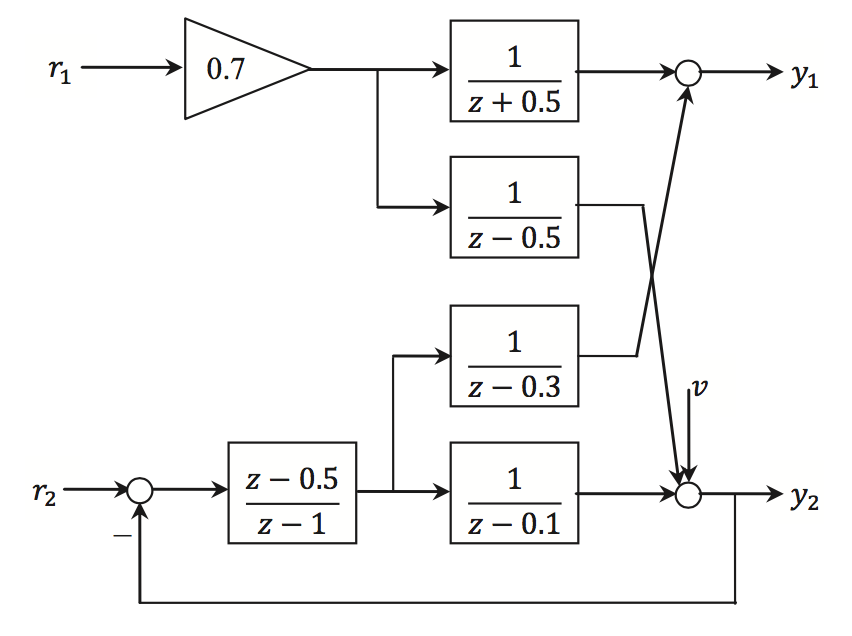

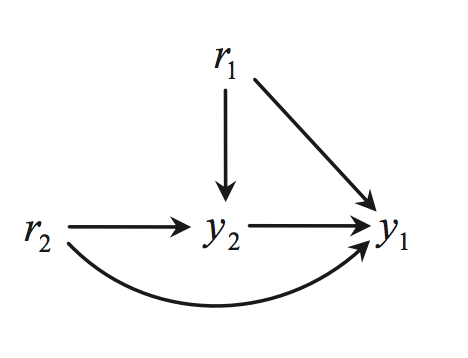

#### Net transfer functions:

$
\begin{align}
y_1(s) &= \frac{0.7}{z + 0.5}r_1(s) + \frac{z - 0.5}{z^2 - 1.3 z + 0.3}r_2(s) - \frac{z - 0.5}{z^2 - 1.3z + 0.3} y_2(s) \\
&= \frac{0.7 z^3 - 0.98 z^2 - 0.539 z + 0.119}{z^4 + 0.1 z^3 - 0.57 z^2 - 0.065z + 0.06} r_1(s) + \frac{z^5 - 1.2z^4 - 0.94 z^3 + 2.48z^2 - 1.3375z + 0.11}{z^6 - 2 z^5 +0.92 z^4 + 0.402 z^3 - 0.4125 z^2 + 0.0965 z - 0.006} r_2(s) \\
&\quad - \frac{z^2 - 0.6z + 0.05}{z^3 - 0.4 z^2 - 0.37 z + 0.12} v(s) \\
\end{align}
$

$
\begin{align}
y_2(s) &= \frac{0.7 z^2 - 0.77z + 0.07}{z^3 - 0.6 z^2 - 0.35z + 0.2} r_1(s) + \frac{z - 0.5}{z^2 - 0.1z - 0.4} r_2(s) + \frac{z^2 - 1.1z + 0.1}{z^2 - 0.1z - 0.4} v(s)
\end{align}
$

where: 

$
\begin{align}
r_1(t), \ r_2(t) &\sim \mathcal{N}(0, 1) \\
v_(t) &\sim \mathcal{N}(0, 0.1)
\end{align}
$

### Generate data
Raw data was generated from Simulink matlab.

### Load raw data from CSV file

In [3]:
ex3 = np.genfromtxt('./ex3_raw.csv', delimiter=',')

IOError: ./ex3_raw.csv not found.

### Convert CSV file to JSON format

In [ ]:
def convert_to_JSON(data):
    '''
    Function to convert imported CSV file for ex3 into JSON format for data structure consistency.

    Input:
        data: Imported CSV file as numpy array

    Returns:
        JSON-like dict of file.
    '''
    ex = {}
    
    ex['r1'] = data[:,0]
    ex['r2'] = data[:,1]
    ex['v'] = data[:,2]
    ex['y1'] = data[:,3]
    ex['y2'] = data[:,4]
    
    return ex

ex3 = convert_to_JSON(ex3)

In [ ]:
ex3

In [ ]:
for key, var in ex3.items():
    print key, np.mean(var), np.std(var)

### Visualise data

In [20]:
visualise_data(ex3, '3')

### Output CSV file from data

In [21]:
output_csv(data=ex3, deg=7, ex='3', burn_in=3000)

In [2]:
ex3['r1'][:10]

NameError: name 'ex3' is not defined

## Troubleshooting

In [69]:
data = np.append(np.genfromtxt('./ex3_raw_noiseless.csv', delimiter=',')[:,:2], np.genfromtxt('./ex3_raw.csv', delimiter=',')[:,-2:]).reshape((6000, 4), order='F')

In [70]:
data, _ = collapse_data(data, 3, '3', 0)

In [71]:
cov = np.cov(data.T)
cov

array([[  1.02e+00,  -2.73e-04,  -1.81e-02,   5.85e-03,  -1.90e-02,
         -6.58e-03,  -5.02e-03,   6.50e-01,   7.12e-01,  -2.50e-02,
         -1.44e-02,  -1.40e-04],
       [ -2.73e-04,   1.02e+00,  -4.55e-04,  -1.71e-02,   6.07e-03,
         -1.90e-02,  -1.20e-02,  -5.02e-03,   6.50e-01,  -1.17e-02,
         -2.46e-02,  -1.41e-02],
       [ -1.81e-02,  -4.55e-04,   1.02e+00,  -1.35e-02,  -1.69e-02,
          6.00e-03,  -3.10e-03,  -1.20e-02,  -5.16e-03,   7.22e-03,
         -1.14e-02,  -2.43e-02],
       [  5.85e-03,  -1.71e-02,  -1.35e-02,   9.94e-01,   1.02e-03,
          7.67e-03,  -9.87e-03,   4.75e-03,  -8.85e-04,   1.87e-02,
          6.67e-01,   6.83e-01],
       [ -1.90e-02,   6.07e-03,  -1.69e-02,   1.02e-03,   9.93e-01,
          9.51e-04,  -1.87e-02,  -9.92e-03,   4.69e-03,   1.25e-02,
          1.85e-02,   6.67e-01],
       [ -6.58e-03,  -1.90e-02,   6.00e-03,   7.67e-03,   9.51e-04,
          9.94e-01,   3.28e-03,  -1.86e-02,  -9.55e-03,  -2.78e-02,
          1.21e-02,

In [72]:
corr = np.corrcoef(data.T)
corr

array([[  1.00e+00,  -2.69e-04,  -1.78e-02,   5.83e-03,  -1.89e-02,
         -6.55e-03,  -3.43e-03,   4.44e-01,   4.86e-01,  -1.73e-02,
         -1.00e-02,  -9.70e-05],
       [ -2.69e-04,   1.00e+00,  -4.48e-04,  -1.70e-02,   6.04e-03,
         -1.90e-02,  -8.19e-03,  -3.43e-03,   4.44e-01,  -8.14e-03,
         -1.71e-02,  -9.74e-03],
       [ -1.78e-02,  -4.48e-04,   1.00e+00,  -1.35e-02,  -1.69e-02,
          5.97e-03,  -2.12e-03,  -8.21e-03,  -3.53e-03,   5.00e-03,
         -7.89e-03,  -1.68e-02],
       [  5.83e-03,  -1.70e-02,  -1.35e-02,   1.00e+00,   1.03e-03,
          7.72e-03,  -6.82e-03,   3.28e-03,  -6.11e-04,   1.31e-02,
          4.67e-01,   4.78e-01],
       [ -1.89e-02,   6.04e-03,  -1.69e-02,   1.03e-03,   1.00e+00,
          9.58e-04,  -1.29e-02,  -6.85e-03,   3.24e-03,   8.78e-03,
          1.30e-02,   4.67e-01],
       [ -6.55e-03,  -1.90e-02,   5.97e-03,   7.72e-03,   9.58e-04,
          1.00e+00,   2.27e-03,  -1.28e-02,  -6.59e-03,  -1.95e-02,
          8.49e-03,

In [73]:
np.savetxt('./cov_NN.csv', cov, delimiter=',')
np.savetxt('./corr_NN.csv', corr, delimiter=',')

In [ ]:
test = np.genfromtxt('./ex3_raw_noiseless.csv', delimiter=',')
test = convert_to_JSON(test)
visualise_data(test, 3)
output_csv(data=test, deg=5, ex=3, burn_in=0)

In [68]:
cov_NN = np.cov(test.T)
corr_NN = np.corrcoef(test.T)

np.savetxt('./cov_NN.csv', cov, delimiter=',')
np.savetxt('./corr_NN.csv', corr, delimiter=',')

AttributeError: 'dict' object has no attribute 'T'

### Generate and visualise attractor

In [2]:
def generate_attractor(data):
    embed_dim = 2

    N = len(data['X'])

    test = {
        'X': np.zeros((N - embed_dim + 1,embed_dim)),
        'Y': np.zeros((N - embed_dim + 1,embed_dim)),
        'Z': np.zeros((N - embed_dim + 1,embed_dim))
    }

    for i in range(embed_dim):
        test['X'][:,i] = data['X'][i:(N - embed_dim + i + 1)]
        test['Y'][:,i] = data['Y'][i:(N - embed_dim + i + 1)]
        test['Z'][:,i] = data['Z'][i:(N - embed_dim + i + 1)]
        
    return test

In [3]:
source = {
    'X': np.array([]).reshape(0, 2),
    'Y': np.array([]).reshape(0, 2),
    'Z': np.array([]).reshape(0, 2)
}

for i in range(1):
    temp = generate_attractor(generate_ex2(6e3))
    source['X'] = np.append(source['X'], temp['X'], axis=0)
    source['Y'] = np.append(source['Y'], temp['Y'], axis=0)
    source['Z'] = np.append(source['Z'], temp['Z'], axis=0)

NameError: name 'generate_ex2' is not defined

In [18]:
trace = go.Scatter(
    x = source['Z'][:,0],
    y = source['Z'][:,1],
    mode='markers',
    marker = {'size': 2}
)

trace_marked = go.Scatter(
    x = np.append(source['Z'][0,0], np.append(source['Z'][1,0], source['Z'][2,0])),
    y = np.append(source['Z'][0,1], np.append(source['Z'][1,1], source['Z'][2,1])),
    mode='markers',
    marker = {'size': 3}
)

data = go.Data([trace, trace_marked])
layout = go.Layout(height = 900, width=900)

figure = go.Figure(data=data, layout=layout)
pyo.iplot(figure)

In [16]:
trace = go.Scatter3d(
    x = source['Z'][:,0],
    y = source['Z'][:,1],
    z = source['Z'][:,2],
    mode='markers',
    marker = {'size': 1}
)

trace_marked = go.Scatter3d(
    x = np.append(source['Z'][0,0], np.append(source['Z'][1,0], source['Z'][2,0])),
    y = np.append(source['Z'][0,1], np.append(source['Z'][1,1], source['Z'][2,1])),
    z = np.append(source['Z'][0,0], np.append(source['Z'][1,0], source['Z'][2,0])),
    mode='markers',
    marker = {'size': 3}
)

data = go.Data([trace, trace_marked])
layout = go.Layout(height = 900, width=900)

figure = go.Figure(data=data, layout=layout)
pyo.iplot(figure)

IndexError: index 2 is out of bounds for axis 1 with size 2

## Example 4: Two-species competition examples

In [87]:
ex4 = generate_ex4(gamma_xy=0, gamma_yx=0.32, is_random=True)

trace_list = []
trace_list.append(
    go.Scatter(
        x = range(len(ex4['X'])),
        y = ex4['Y'],
        name ='Y'
    )
)

trace_list.append(
    go.Scatter(
        x = range(len(ex4['X'])),
        y = ex4['X'],
        name ='X'
    )
)

pyo.iplot(go.Figure(data=go.Data(trace_list), layout=go.Layout()))

[  90.  177.  150.   94.   71.   97.   53.  154.  159.]
[   90.   267.   417.   511.   582.   679.   732.   886.  1000.]


In [5]:
def autocorr(x):
    result = np.correlate(x, x, mode='full')
    return result[result.size/2:] / np.max(result)

def plot_autocorr(x):
    autocorr_result = autocorr(x)
    trace = go.Scatter(
        x = range(len(autocorr_result)),
        y = autocorr_result
    )
    
    pyo.iplot(go.Figure(data=go.Data([trace]), layout=go.Layout()))
    
    # Print point of intersection
    print 'Recommended value for tau: {}'.format(np.argmax(autocorr_result < (1. / np.exp(1))))
    
plot_autocorr(generate_ex4(0.1, 0.2)['Y'])

Recommended value for tau: 21869


In [1]:
def generate_ex4(gamma_xy, gamma_yx, N=1000, randomise=False):
    '''
    Generate values for a 2-species predator-prey model.
    '''
    def switch(a, b):
        '''
        Switches the values of 'a' and 'b'
        '''
        return b, a
    
    def generate_random_periods(N, low, high):
        '''
        Generate an array containing cumulative period values of when the coupling parameters should be switch.
        Inputs:
            N:    Length of output
            low:  Lower bound for random beta sampling
            high: Upper bound for random beta sampling
        '''
        # Generate an array of random integers between low and high sampled from a beta distribution
        temp = np.array([])
        while np.sum(temp) < N:
            temp = np.append(temp, np.random.randint(low, high))
        
        # Create cumulative period length counter
        n = 0
        for i in range(len(temp) - 1):
            temp[i + 1] += temp[i]
        temp[-1] = N
        
        return temp
    
    
    ###################
    # Function begins #
    ###################
    
    r_x = 3.7
    r_y = 3.8
    
    ex = {
        'X': np.zeros((N,)),
        'Y': np.zeros((N,)),
        'gamma_xy': np.zeros((N,)),
        'gamma_yx': np.zeros((N,)),
    }
    
    ex['X'][0] = np.random.uniform(0, .1)
    ex['Y'][0] = np.random.uniform(0, .1)
    
    # If is_random = True, generate array of random time indices to switch gamma parameters:
    if randomise == True:
        periods = generate_random_periods(N, 50, 200)
        ex['periods'] = periods
    
    for k in range(N - 1):
        if k == periods[0] - 1:
            gamma_xy, gamma_yx = switch(gamma_xy, gamma_yx)
            periods = np.delete(periods, 0)
            
        ex['X'][k + 1] = ex['X'][k] * (r_x - r_x * ex['X'][k] - gamma_xy * ex['Y'][k])
        ex['Y'][k + 1] = ex['Y'][k] * (r_y - r_y * ex['Y'][k] - gamma_yx * ex['X'][k])
        ex['gamma_xy'][k + 1] = gamma_xy
        ex['gamma_yx'][k + 1] = gamma_yx
        
    ex['X'] = ex['X'][20:]
    ex['Y'] = ex['Y'][20:]
    ex['gamma_xy'] = ex['gamma_xy'][20:]
    ex['gamma_yx'] = ex['gamma_yx'][20:] 
        
    return ex

def generate_delayed_vector(data, embed_dim, delay=1):
    
    assert embed_dim > 1
    assert delay >= 1

    N = len(data['X'])
    N_embed = N - (embed_dim - 1) * delay

    data_embed = {
        'X': np.zeros((N_embed, embed_dim)),
        'Y': np.zeros((N_embed, embed_dim)),
        #'Z': np.zeros((N - embed_dim + 1,embed_dim)),
    }

    for i in range(embed_dim):
        data_embed['X'][:,i] = data['X'][(i * delay):(N_embed + i * delay)]
        data_embed['Y'][:,i] = data['Y'][(i * delay):(N_embed + i * delay)]
        # data_embed['Z'][:,i] = data['Z'][i:(N - embed_dim + i + 1)]
        
    data_embed['gamma_xy'] = data['gamma_xy']
    data_embed['gamma_yx'] = data['gamma_yx']
        
    return data_embed

In [86]:
embed_dim = 2
delay = 1

source_data = generate_delayed_vector(data=generate_ex4(gamma_xy=0., gamma_yx=0.32, is_random=True), embed_dim=embed_dim, delay=delay)
np.savez('./Data/RBFN/source_ex4_rand.npz', **source_data)
    
print 'Shape of source data: ', source_data['X'].shape

[ 192.   77.  158.  137.  158.  186.  183.]
[  192.   269.   427.   564.   722.   908.  1000.]
Shape of source data:  (979, 2)


In [5]:
data_trace = go.Scatter3d(
    x = source_data['Y'][:,0],
    y = source_data['Y'][:,1],
    z = source_data['Y'][:,2],
    mode='markers',
    marker = {'size': 3}
)

target_trace = go.Scatter3d(
    x = source_data['X'][:,0],
    y = source_data['X'][:,1],
    z = source_data['X'][:,2],
    mode='markers',
    marker = {'size': 3}
)


layout = go.Layout(height = 900, width=900)

figure = go.Figure(data=go.Data([data_trace]), layout=layout)
pyo.iplot(figure)

figure = go.Figure(data=go.Data([target_trace]), layout=layout)
pyo.iplot(figure)

IndexError: index 2 is out of bounds for axis 1 with size 2

Finding suitable value for $\tau$

In [ ]:
q = 1.1



In [17]:
np.savetxt('./target2.txt', source_data['Y'][:,2], delimiter=' ', newline=' ')

In [14]:
?np.savetxt